In [1]:
import math
import torch
import hess
import matplotlib.pyplot as plt
from hess.nets import Transformer
import hess.loss_surfaces as loss_surfaces
import numpy as np
import sklearn.datasets as datasets
import hess.utils as utils

In [2]:
def twospirals(n_points, noise=.5, random_state=920):
    """
     Returns the two spirals dataset.
    """
    n = np.sqrt(np.random.rand(n_points,1)) * 600 * (2*np.pi)/360
    d1x = -1.5*np.cos(n)*n + np.random.randn(n_points,1) * noise
    d1y =  1.5*np.sin(n)*n + np.random.randn(n_points,1) * noise
    return (np.vstack((np.hstack((d1x,d1y)),np.hstack((-d1x,-d1y)))),
            np.hstack((np.zeros(n_points),np.ones(n_points))))

In [3]:
np.random.permutation(10)

array([3, 0, 5, 1, 4, 8, 2, 9, 7, 6])

In [4]:
X, Y = twospirals(1500, noise=1.5)
perm = np.random.permutation(3000)
X = X[perm,:]
Y = Y[perm]
num_test = 1000

In [5]:
X.shape

(3000, 2)

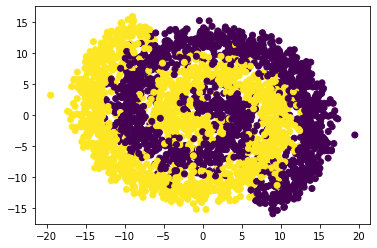

In [6]:
plt.scatter(X[:,0], X[:,1], c=Y)

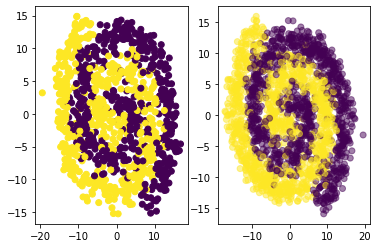

In [7]:
fig, ax = plt.subplots(1, 2)
ax[0].scatter(X[:num_test, 0], X[:num_test, 1], c=Y[:num_test])
ax[1].scatter(X[num_test:,0], X[num_test:, 1], c=Y[num_test:], alpha = 0.5)

In [8]:

train_x = torch.FloatTensor(X[:num_test])
test_x = torch.FloatTensor(X[num_test:])

train_y = torch.FloatTensor(Y[:num_test]).unsqueeze(-1)
test_y = torch.FloatTensor(Y[num_test:]).unsqueeze(-1)

In [9]:
use_cuda = torch.cuda.is_available()
if use_cuda:
    torch.cuda.set_device(0)
    torch.set_default_tensor_type(torch.cuda.FloatTensor)
    train_x, train_y = train_x.cuda(), train_y.cuda()
    test_x, test_y = test_x.cuda(), test_y.cuda()

In [10]:
def train_model(model, train_x, train_y):
    optimizer = torch.optim.Adam(model.parameters(), lr=0.01)
    loss_func = torch.nn.BCEWithLogitsLoss()

    losses = []

    for step in range(2000):
        optimizer.zero_grad()
        outputs = model(train_x)

        loss=loss_func(outputs, train_y)
        trainL = loss.detach().item()
        if step % 500 is 0:
            print("train loss = ", trainL)
        losses.append(trainL)
        loss.backward()
        optimizer.step()
    
    return losses

In [11]:
def get_model(hidden_size=20, n_hidden=5):
    in_dim = 2
    out_dim = 1
    model = hess.nets.SimpleNet(in_dim, out_dim, n_hidden=n_hidden, hidden_size=hidden_size,
                         activation=torch.nn.ELU(), bias=True)
    
    if use_cuda:
        model=model.cuda()
        
    return model

In [12]:
import hess.utils as utils

def get_hessian(model, train_x, train_y):
    n_par = sum(torch.numel(p) for p in model.parameters())

    hessian = torch.zeros(n_par, n_par)
    for pp in range(n_par):
        base_vec = torch.zeros(n_par).unsqueeze(0)
        base_vec[0, pp] = 1.

        base_vec = utils.unflatten_like(base_vec, model.parameters())
        utils.eval_hess_vec_prod(base_vec, model,
                                criterion=torch.nn.BCEWithLogitsLoss(),
                                inputs=train_x, targets=train_y)
        if pp == 0:
            output = utils.gradtensor_to_tensor(model, include_bn=True)
            hessian = torch.zeros(output.nelement(), output.nelement())
            hessian[:, pp] = output

        hessian[:, pp] = utils.gradtensor_to_tensor(model, include_bn=True).cpu()
        
    return hessian

In [13]:
rep_full_list = []

for rep in range(25):

    eigs_list = []
    losses_list = []
    num_pars = []
    #hessian_list = []
    test_loss_list = []
    
    for i in range(1, 15):
        print('now running', i)

        model = get_model(n_hidden = i)
        n_par = sum(p.numel() for p in model.parameters())

        losses = train_model(model, train_x, train_y)

        hessian = get_hessian(model, train_x, train_y).detach()
        
        with torch.no_grad():
            test_loss = torch.nn.BCEWithLogitsLoss()(model(test_x), test_y)
            print('Test loss is :', test_loss.item())
        
        losses_list.append(losses)
        eigs_list.append(np.linalg.eig(hessian.cpu().numpy())[0])
        num_pars.append(n_par)
        #hessian_list.append(hessian)
        test_loss_list.append(test_loss.item())
        del hessian, model
        
    rep_full_list.append([losses_list, eigs_list, test_loss_list])

now running 1
train loss =  0.6727606058120728
train loss =  0.2274625301361084
train loss =  0.21719926595687866
train loss =  0.21090641617774963
Test loss is : 0.28522688150405884
now running 2
train loss =  0.6895909905433655
train loss =  0.20238599181175232
train loss =  0.17226263880729675
train loss =  0.15554948151111603
Test loss is : 0.49029383063316345
now running 3
train loss =  0.7037460207939148
train loss =  0.17586994171142578
train loss =  0.1621851921081543
train loss =  0.0803045779466629
Test loss is : 0.9841452836990356
now running 4
train loss =  0.6865869760513306
train loss =  0.20060519874095917
train loss =  0.13204079866409302
train loss =  0.16526558995246887
Test loss is : 0.8925902843475342
now running 5
train loss =  0.6892404556274414
train loss =  0.23018157482147217
train loss =  0.12367972731590271
train loss =  0.0675044134259224
Test loss is : 1.0520151853561401
now running 6
train loss =  0.6916204690933228
train loss =  0.1773541122674942
train l

now running 4
train loss =  0.6860918402671814
train loss =  0.16523803770542145
train loss =  0.09869611263275146
train loss =  0.13222694396972656
Test loss is : 1.2174224853515625
now running 5
train loss =  0.7031314969062805
train loss =  0.20039914548397064
train loss =  0.09355824440717697
train loss =  0.061885274946689606
Test loss is : 1.3317902088165283
now running 6
train loss =  0.698779821395874
train loss =  0.1837826371192932
train loss =  0.11436168849468231
train loss =  0.08564100414514542
Test loss is : 1.2005542516708374
now running 7
train loss =  0.6946909427642822
train loss =  0.21581578254699707
train loss =  0.14727109670639038
train loss =  0.14820519089698792
Test loss is : 0.9589419364929199
now running 8
train loss =  0.6939963698387146
train loss =  0.1790853887796402
train loss =  0.14278867840766907
train loss =  0.14976482093334198
Test loss is : 0.3899358808994293
now running 9
train loss =  0.6958758234977722
train loss =  0.19951608777046204
train 

now running 7
train loss =  0.7023983597755432
train loss =  0.16052158176898956
train loss =  0.10430866479873657
train loss =  0.08296336978673935
Test loss is : 1.1113611459732056
now running 8
train loss =  0.6994848847389221
train loss =  0.18739056587219238
train loss =  0.1758212298154831
train loss =  0.08652947098016739
Test loss is : 0.5949990153312683
now running 9
train loss =  0.6972257494926453
train loss =  0.23586536943912506
train loss =  0.14918598532676697
train loss =  0.13183455169200897
Test loss is : 0.8180744051933289
now running 10
train loss =  0.6930264234542847
train loss =  0.2242976725101471
train loss =  0.14508996903896332
train loss =  0.14662441611289978
Test loss is : 1.0949620008468628
now running 11
train loss =  0.6945887804031372
train loss =  0.220271497964859
train loss =  0.21804560720920563
train loss =  0.1960892230272293
Test loss is : 0.5936470627784729
now running 12
train loss =  0.717298150062561
train loss =  0.1991809457540512
train lo

train loss =  0.20325681567192078
train loss =  0.13864129781723022
train loss =  0.1467391401529312
Test loss is : 0.8086485862731934
now running 11
train loss =  0.6930949091911316
train loss =  0.19346559047698975
train loss =  0.15846732258796692
train loss =  0.1648695468902588
Test loss is : 0.7639564275741577
now running 12
train loss =  0.6930347084999084
train loss =  0.19557903707027435
train loss =  0.15816029906272888
train loss =  0.1817799210548401
Test loss is : 0.6663067936897278
now running 13
train loss =  0.6934911012649536
train loss =  0.1899968683719635
train loss =  0.16097064316272736
train loss =  0.1514645516872406
Test loss is : 0.7025764584541321
now running 14
train loss =  0.6945233345031738
train loss =  0.18368464708328247
train loss =  0.19155099987983704
train loss =  0.1447966992855072
Test loss is : 0.4253791570663452
now running 1
train loss =  0.837226927280426
train loss =  0.22995120286941528
train loss =  0.20894934237003326
train loss =  0.1977

train loss =  0.18767975270748138
train loss =  0.14644655585289001
train loss =  0.2390003204345703
Test loss is : 0.7703393697738647
now running 14
train loss =  0.6940500736236572
train loss =  0.19660037755966187
train loss =  0.2080698311328888
train loss =  0.16251078248023987
Test loss is : 0.6542351245880127
now running 1
train loss =  0.8472663760185242
train loss =  0.23063760995864868
train loss =  0.20951329171657562
train loss =  0.19974684715270996
Test loss is : 0.3008064031600952
now running 2
train loss =  0.6689956188201904
train loss =  0.20308969914913177
train loss =  0.18655191361904144
train loss =  0.1907752901315689
Test loss is : 0.3936504125595093
now running 3
train loss =  0.6900010704994202
train loss =  0.2009638100862503
train loss =  0.17390015721321106
train loss =  0.14979226887226105
Test loss is : 0.524783730506897
now running 4
train loss =  0.6975615620613098
train loss =  0.18045666813850403
train loss =  0.1440773904323578
train loss =  0.382222

train loss =  0.19150365889072418
train loss =  0.15567539632320404
train loss =  0.1430450975894928
Test loss is : 0.6159120202064514
now running 3
train loss =  0.6913506984710693
train loss =  0.17711752653121948
train loss =  0.13439378142356873
train loss =  0.11305678635835648
Test loss is : 0.7767937779426575
now running 4
train loss =  0.704965353012085
train loss =  0.20075935125350952
train loss =  0.15316757559776306
train loss =  0.12038619816303253
Test loss is : 0.9534308910369873
now running 5
train loss =  0.6923854351043701
train loss =  0.18345265090465546
train loss =  0.0969281867146492
train loss =  0.07372503727674484
Test loss is : 1.403144359588623
now running 6
train loss =  0.6922277212142944
train loss =  0.1951996237039566
train loss =  0.15540266036987305
train loss =  0.11292660236358643
Test loss is : 1.8016027212142944
now running 7
train loss =  0.6961777806282043
train loss =  0.16005896031856537
train loss =  0.24447837471961975
train loss =  0.096609

train loss =  0.20961272716522217
train loss =  0.16158023476600647
train loss =  0.12614528834819794
Test loss is : 0.7294161915779114
now running 6
train loss =  0.709434449672699
train loss =  0.17993009090423584
train loss =  0.11909906566143036
train loss =  0.17496731877326965
Test loss is : 0.8959729671478271
now running 7
train loss =  0.6984066963195801
train loss =  0.19967889785766602
train loss =  0.11891234666109085
train loss =  0.1610116958618164
Test loss is : 1.0697849988937378
now running 8
train loss =  0.6927043795585632
train loss =  0.16423213481903076
train loss =  0.13810230791568756
train loss =  0.09407970309257507
Test loss is : 0.3170589208602905
now running 9
train loss =  0.6973912715911865
train loss =  0.18671084940433502
train loss =  0.13091489672660828
train loss =  0.12193818390369415
Test loss is : 0.9629148840904236
now running 10
train loss =  0.6937693953514099
train loss =  0.1850263923406601
train loss =  0.1801435351371765
train loss =  0.1335

train loss =  0.20220035314559937
train loss =  0.15774771571159363
train loss =  0.13787557184696198
Test loss is : 1.0533612966537476
now running 9
train loss =  0.6942377090454102
train loss =  0.24684904515743256
train loss =  0.14308299124240875
train loss =  0.1302836537361145
Test loss is : 0.912452757358551
now running 10
train loss =  0.6936012506484985
train loss =  0.19505445659160614
train loss =  0.1596582531929016
train loss =  0.12918125092983246
Test loss is : 0.7049104571342468
now running 11
train loss =  0.6979740262031555
train loss =  0.20632657408714294
train loss =  0.1996721476316452
train loss =  0.1202113926410675
Test loss is : 0.7777274250984192
now running 12
train loss =  0.693678617477417
train loss =  0.1867363601922989
train loss =  0.14662812650203705
train loss =  0.1413373053073883
Test loss is : 0.9132131934165955
now running 13
train loss =  0.6970074772834778
train loss =  0.23351100087165833
train loss =  0.188710555434227
train loss =  0.1726504

In [14]:
def eff_dim(x, s = 0.1):
    return np.sum(x / (x + s))



In [15]:
ed_list = []
fl_list = []
for losses_list, eigs_list, _ in rep_full_list:
    eff_dim_arr = np.array([eff_dim(ee, s = 50.) for ee in eigs_list])
    final_loss = [l[-1] for l in losses_list]
    
    ed_list.append(eff_dim_arr)
    fl_list.append(final_loss)
    
ed_list = np.array(ed_list)
fl_list = np.array(fl_list)
tl_list = np.array([ee[-1] for ee in rep_full_list])

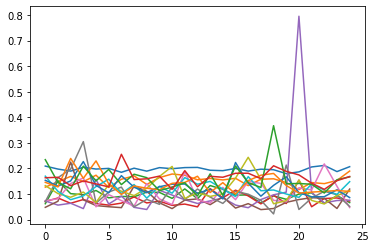

In [22]:
plt.plot(fl_list)

Text(0.5, 0.98, 'Increasing Depth')

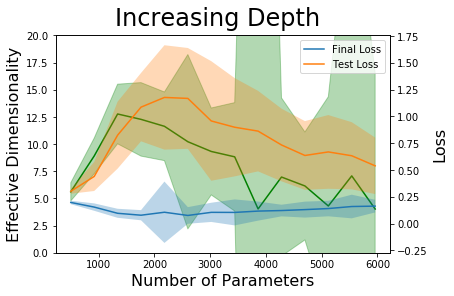

In [36]:
fig, ax = plt.subplots()

ax.plot(num_pars, ed_list.mean(0), label = 'Effective Dim', color = 'green')
ax.fill_between(num_pars, ed_list.mean(0) - 2 * ed_list.std(0), ed_list.mean(0) + 2*ed_list.std(0), alpha = 0.3,
               color='green')
ax.set_ylabel('Effective Dimensionality', fontsize = 16)
ax.set_ylim((0, 20))

ax2 = ax.twinx()
ax2.plot(num_pars, fl_list.mean(0), label = 'Final Loss')
ax2.fill_between(num_pars, fl_list.mean(0) - 2 * fl_list.std(0), fl_list.mean(0) + 2*fl_list.std(0), alpha = 0.3)

ax2.plot(num_pars, tl_list.mean(0), label = 'Test Loss')
ax2.fill_between(num_pars, tl_list.mean(0) - 2 * tl_list.std(0), tl_list.mean(0) + 2*tl_list.std(0), alpha = 0.3)
ax2.set_ylabel('Loss', fontsize = 16)
ax2.legend()

ax.set_xlabel('Number of Parameters', fontsize = 16)
fig.suptitle('Increasing Depth', fontsize = 24)
#plt.semilogy()
#plt.ylim(0, 3)
#plt.vlines(train_x.shape[0], 0, 3)

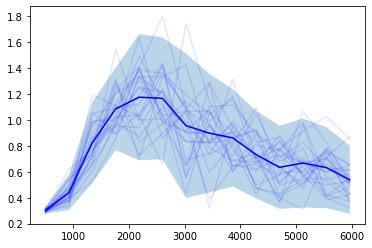

In [17]:
plt.plot(num_pars, tl_list.mean(0), label = 'Test Loss', color= 'blue')
plt.fill_between(num_pars, tl_list.mean(0) - 2 * tl_list.std(0), tl_list.mean(0) + 2*tl_list.std(0), alpha = 0.3)

plt.plot(num_pars, tl_list.T, color = 'blue', alpha = 0.1)

(0, 16)

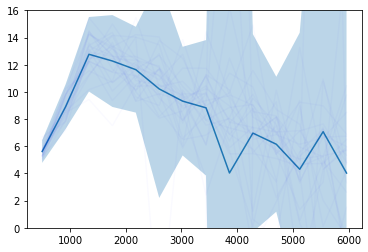

In [18]:
plt.plot(num_pars, ed_list.mean(0), label = 'Effective Dim')
plt.fill_between(num_pars, ed_list.mean(0) - 2 * ed_list.std(0), ed_list.mean(0) + 2*ed_list.std(0), alpha = 0.3)

plt.plot(num_pars, ed_list.T, color = 'blue', alpha = 0.02)
plt.ylim((0, 16))

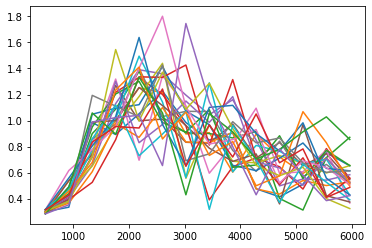

In [19]:
plt.plot(num_pars, tl_list.T)

In [20]:
import pickle

In [39]:
with open('../saved-experiments/two_spirals_descent_dimensionality.pkl', 'wb') as handle:
    pickle.dump([rep_full_list, num_pars], handle, pickle.HIGHEST_PROTOCOL)

In [37]:
rep_full_list

[[[[0.6727606058120728,
    0.6363298892974854,
    0.6374333500862122,
    0.6345940232276917,
    0.626112163066864,
    0.6186568737030029,
    0.6149540543556213,
    0.613818347454071,
    0.61308753490448,
    0.6114097237586975,
    0.6087830066680908,
    0.6060022115707397,
    0.6035308837890625,
    0.601213812828064,
    0.5989577174186707,
    0.5971238017082214,
    0.5960061550140381,
    0.595154881477356,
    0.5937678217887878,
    0.5916627645492554,
    0.5895601511001587,
    0.5881877541542053,
    0.5873214602470398,
    0.5859924554824829,
    0.5838513374328613,
    0.5816404819488525,
    0.580136239528656,
    0.5790649652481079,
    0.5775537490844727,
    0.5755030512809753,
    0.5736762881278992,
    0.5724738836288452,
    0.5713667273521423,
    0.5698443651199341,
    0.5682468414306641,
    0.567039430141449,
    0.5659273266792297,
    0.5644822120666504,
    0.5630092024803162,
    0.5617080926895142,
    0.5601204037666321,
    0.558320939540863,
 

In [ ]:
with open('../saved-experiments/two_spir')